In [7]:
# pip install fastdtw

In [8]:
from scipy.ndimage import filters
from PIL import Image, ImageChops
import matplotlib.pyplot as plt
from fastdtw import fastdtw
import numpy as np
import cv2
import scipy
import glob
import scipy.ndimage
import skimage


In [9]:
import tkinter as tk
from tkinter import filedialog
from PIL import Image, ImageTk

class ImageSelectorApp:
    def __init__(self, master):
        self.master = master
        self.master.title("Select Puzzle")
        
        self.hint_image_path = None
        self.puzzle_pieces_path = None

        # إضافة متغيرات لعرض الصور
        self.hint_image_label = tk.Label(self.master, text="Hint Image:")
        self.hint_image_label.pack(pady=5)

        self.puzzle_image_label = tk.Label(self.master, text="Puzzle Pieces Image:")
        self.puzzle_image_label.pack(pady=5)

        self.hint_button = tk.Button(self.master, text="Select Hint", command=self.choose_hint_image)
        self.hint_button.pack(pady=10)

        self.puzzle_button = tk.Button(self.master, text="Select Pieces Puzzle", command=self.choose_puzzle_pieces)
        self.puzzle_button.pack(pady=10)

        self.submit_button = tk.Button(self.master, text="Solve", command=self.submit_images)
        self.submit_button.pack(pady=20)

        # متغيرات لتخزين المسارات المحددة
        self.saved_hint_image_path = None
        self.saved_puzzle_pieces_path = None

    def choose_hint_image(self):
        self.hint_image_path = filedialog.askopenfilename(filetypes=[("Image files", "*.png;*.jpg;*.jpeg")])
        self.show_image(self.hint_image_path, self.hint_image_label)

    def choose_puzzle_pieces(self):
        self.puzzle_pieces_path = filedialog.askopenfilename(filetypes=[("Image files", "*.png;*.jpg;*.jpeg")])
        self.show_image(self.puzzle_pieces_path, self.puzzle_image_label)

    def submit_images(self):
        if self.hint_image_path and self.puzzle_pieces_path:
            print(f"تم اختيار صورة الرمز: {self.hint_image_path}")
            print(f"تم اختيار صورة الأجزاء: {self.puzzle_pieces_path}")
            
            # حفظ المسارات المحددة
            self.saved_hint_image_path = self.hint_image_path
            self.saved_puzzle_pieces_path = self.puzzle_pieces_path

            # يمكنك استخدام المسارات المحددة كما تحتاج هنا
            self.master.destroy()  # إغلاق نافذة التطبيق بعد الإرسال
        else:
            print("الرجاء اختيار صورتي الرمز والأجزاء.")

    def show_image(self, image_path, label_widget):
        if image_path:
            img = Image.open(image_path)
            img = img.resize((300, 300), resample=Image.LANCZOS)  # Use LANCZOS as an alternative
            img = ImageTk.PhotoImage(img)
            label_widget.configure(image=img)
            label_widget.image = img
        else:
            label_widget.configure(image=None)

# إنشاء نافذة التطبيق
root = tk.Tk()
app = ImageSelectorApp(root)

# تشغيل دورة الحدث
root.mainloop()

# استخدام المسارات المحفوظة في باقي الكود
if app.saved_hint_image_path and app.saved_puzzle_pieces_path:
    print("استخدم المسارات التالية:")
    print(f"مسار صورة الرمز: {app.saved_hint_image_path}")
    print(f"مسار صورة الأجزاء: {app.saved_puzzle_pieces_path}")
else:
    print("لم يتم اختيار صور.") 


لم يتم اختيار صور.


In [10]:


def showlist_horizontal_save(tiles, height=5, save_path=None):
    n_images = len(tiles)
    fig, axes = plt.subplots(1, n_images, figsize=(height * n_images, height))
    
    # تعيين لون الخلفية إلى الأسود
    fig.patch.set_facecolor('black')
    
    for ax, img in zip(axes, tiles):
        ax.imshow(img)
        ax.axis('off')

    # حفظ الصورة
    plt.savefig(save_path, bbox_inches='tight', pad_inches=0.1)
    plt.show()


In [11]:
# del sorted
puzzle = np.array(Image.open(app.saved_puzzle_pieces_path).convert('RGBA'))
print(puzzle.shape)
thresh = cv2.cvtColor(puzzle, cv2.COLOR_RGBA2GRAY)
thresh = cv2.adaptiveThreshold(thresh, 255, 0, 1, 3, 3)
thresh = cv2.GaussianBlur(thresh, (3,3), 1)
contours, _ = cv2.findContours(thresh, 0, 1)
sorted = sorted([[cnt.shape[0], i] for i, cnt in enumerate(contours)], reverse=True)[:]
biggest = [contours[s[1]] for s in sorted]
fill = cv2.drawContours(np.zeros(puzzle.shape[:2]), biggest, -1, 255, thickness=cv2.FILLED)
smooth = filters.median_filter(fill.astype('uint8'), size=10)
trim_contours, _ = cv2.findContours(smooth, 0, 1)
cv2.drawContours(smooth, trim_contours, -1, color=0, thickness=1)

contours, _ = cv2.findContours(smooth, 0, 1)

tiles, tile_centers = [], []
for i in range(len(contours)):
  x, y, w, h = cv2.boundingRect(contours[i])
  shape, tile = np.zeros(puzzle.shape[:2]), np.zeros((300,300,4), 'uint8')
  cv2.drawContours(shape, [contours[i]], -1, color=1, thickness=-1)
  shape = (puzzle * shape[:,:,None])[y:y+h, x:x+w, :]
  tile[(300-h)//2:(300-h)//2+h,(300-w)//2:(300-w)//2+w] = shape
  tiles.append(tile)
  tile_centers.append((h//2+y, w//2+x))
showlist_horizontal_save(tiles, height=5, save_path='puzzle_pieces.jpg')



AttributeError: 'NoneType' object has no attribute 'read'

C:\Users\Karam_Farwan\AppData\Local\Temp\ipykernel_15012\829346652.py:20: DeprecationWarning: Please use `binary_opening` from the `scipy.ndimage` namespace, the `scipy.ndimage.morphology` namespace is deprecated.
  image=scipy.ndimage.morphology.binary_opening(binarized_image,
C:\Users\Karam_Farwan\AppData\Local\Temp\ipykernel_15012\829346652.py:22: DeprecationWarning: Please use `binary_closing` from the `scipy.ndimage` namespace, the `scipy.ndimage.morphology` namespace is deprecated.
  image=scipy.ndimage.morphology.binary_closing(image,


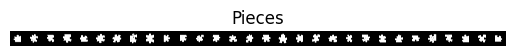

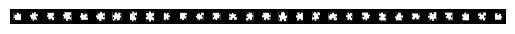

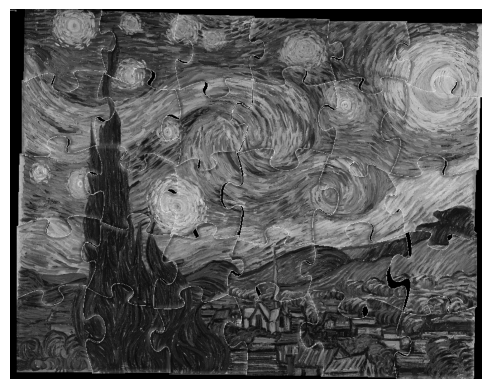

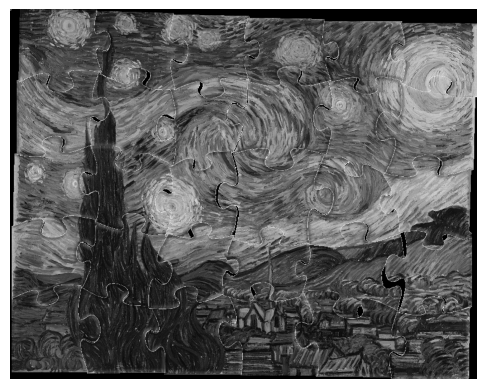

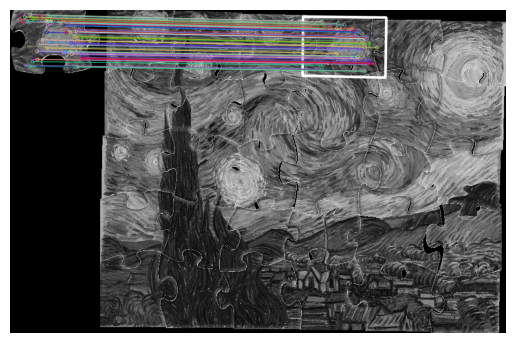

...

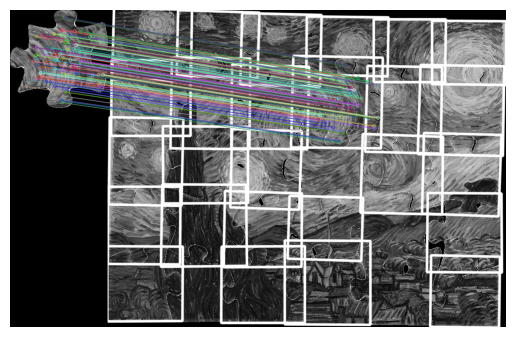

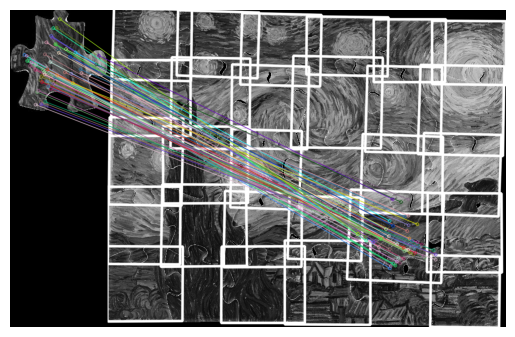

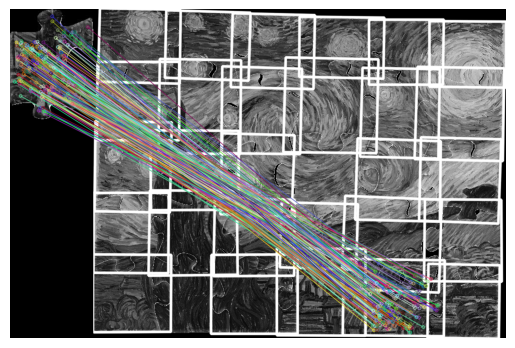

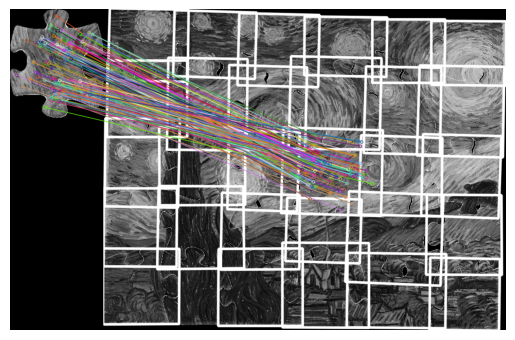

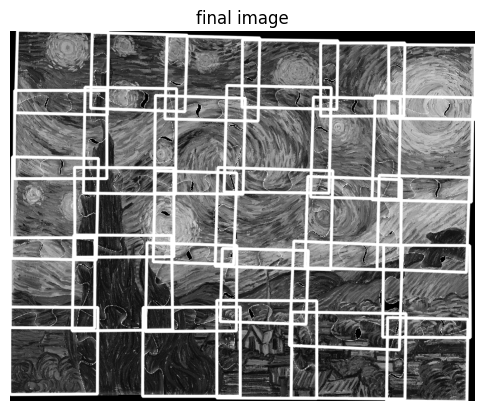

In [ ]:
# Hint_Image = 'van-gogh.png'
Puzzle_Pieces = 'puzzle_pieces.jpg'
Hint_Image = app.saved_hint_image_path

complete_image = Image.open(Hint_Image)
complete_image=complete_image.convert('L')

complete_image= np.asarray(complete_image,dtype="uint8")/255.0 
complete_imagcopy =complete_image
im=Image.open(Puzzle_Pieces) #Requires a black background

gray_im = im.convert('L')
gray_im = np.asarray(gray_im,dtype="uint8")/255.0

outh,outw = complete_image.shape
output_image = np.zeros((outh,outw))

binarized_image=np.zeros(gray_im.shape)
binarized_image[gray_im>0.06]=1.0
image=scipy.ndimage.morphology.binary_opening(binarized_image, 
                 structure=np.ones((3,3)), iterations=1, output=None, origin=0)
image=scipy.ndimage.morphology.binary_closing(image, 
             structure=np.ones((3,3)), iterations=1, output=None, origin=0)
#image[image>0.06]=1.0
cv_image = skimage.util.img_as_ubyte(image)
contours, hierarchy = cv2.findContours(cv_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)


#perimeter = cv2.arcLength(cnt,True)
cv2.drawContours(cv_image,contours,-1,(255,255,0),2)
plt.imshow(cv_image,cmap=plt.cm.gray)
plt.title("Pieces")
plt.axis('off')
plt.show()

#recon_img =np.zeros((h1,w1))
piece_array = []
for i in range(0,len(contours)):
        c =np.asarray(contours[i])
        x,y,w,h = cv2.boundingRect(c)
        cv2.rectangle(cv_image,(x,y),(x+w,y+h),(255,255,0),2)
        crop_img = gray_im[y:y+h, x:x+w] # Crop from x, y, w, h -> 100, 200, 300, 400
        #crop_img=np.asarray(crop_img,dtype="uint8")
        piece_array.append(crop_img)
plt.imshow(cv_image,cmap=plt.cm.gray)
plt.axis('off')
plt.show()


# Initiate SIFT detector
sift = cv2.SIFT_create()
    
complete_imagcopy = skimage.util.img_as_ubyte(complete_imagcopy)
kp2, des2 = sift.detectAndCompute(complete_imagcopy,None)

bf = cv2.BFMatcher()
    
for v in piece_array:
#     plt.imshow(v)
#     plt.show()
    
    # find the keypoints and descriptors with SIFT
    v= skimage.util.img_as_ubyte(v)
    kp1, des1 = sift.detectAndCompute(v,None)
    matches = bf.knnMatch(des1, des2, k=2)
    #matches = flann.knnMatch(des1,des2,k=2)

    # store all the good matches as per Lowe's ratio test.
    good = []
    for m,n in matches:
        if m.distance < 0.7*n.distance:
            good.append(m)

    
    MIN_MATCH_COUNT = 10

    if len(good)>MIN_MATCH_COUNT:
        src_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
        dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)

        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,5.0)
        matchesMask = mask.ravel().tolist()

        h,w = v.shape
        pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
        dst = cv2.perspectiveTransform(pts,M)
        complete_imagcopy = cv2.polylines(complete_imagcopy,[np.int32(dst)],True,255,3, cv2.LINE_AA)

    
    
    
    else:
        matchesMask = None
    draw_params = dict(matchColor = (0,255,0),singlePointColor = None,matchesMask = matchesMask, 
                   flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    #img3 = cv2.drawMatches(complete_imagcopy,kp1,v,kp2,good,None,**draw_params)
    img3 = cv2.drawMatches(v,kp1,complete_imagcopy,kp2,good,None,flags=2)
    
    #img3 = cv2.drawMatches(v,kp1,complete_imagcopy,kp2,good,None,**draw_params)
    plt.imshow(img3)
    plt.axis('off')
    plt.show()

plt.imshow(complete_imagcopy,cmap = 'gray')
plt.title("final image")
plt.axis('off')
plt.show()